<a href="https://colab.research.google.com/github/Lipun101/astronomical-data-analysis/blob/main/Astronomical_Stellar_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Astronomical Stellar Data Analysis**

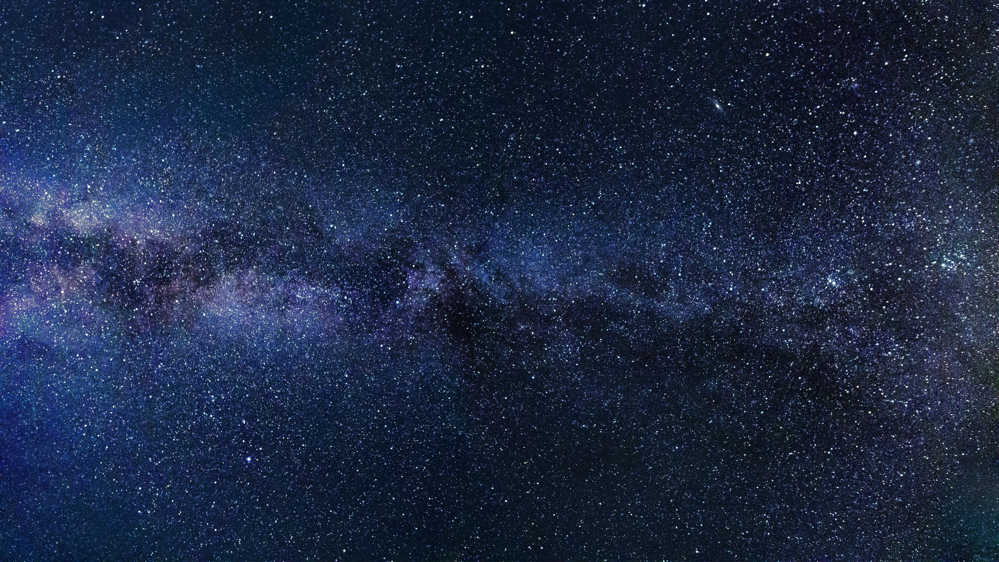

**Here's a brief description of each column:**

1. Temperature (K): The surface temperature of the star in Kelvin (K).
2. Luminosity (L/Lo): The energy output of the star relative to the Sun's luminosity (Lo).
3. Radius (R/Ro): The size of the star relative to the Sun's radius (Ro).
4. Absolute magnitude (Mv): The intrinsic brightness of the star, measured on a logarithmic scale.
5. Star type: The classification of the star based on its spectral characteristics (e.g., Main Sequence, Red Giant, White Dwarf, etc.).
6. Star color: The color of the star, which is related to its surface temperature (e.g., Red, Orange, Yellow, White, Blue).
7. Spectral Class: The classification of the star based on its spectral lines and surface temperature (e.g., O, B, A, F, G, K, M).


In [ ]:
# Importing the libraries
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
# Check into the data of the csv file
stardf = pd.read_csv('https://drive.google.com/uc?id=1BQVc6MHjQFtDC9iP1isT_K4ojVe_Oil-')
stardf.head()

,Temperature (K),Luminosity(L/Lo),Radius(R/Ro),Absolute magnitude(Mv),Star type,Star color,Spectral Class
0,3068,0.002400,0.1700,16.12,0,Red,M
1,3042,0.000500,0.1542,16.60,0,Red,M
2,2600,0.000300,0.1020,18.70,0,Red,M
3,2800,0.000200,0.1600,16.65,0,Red,M
4,1939,0.000138,0.1030,20.06,0,Red,M


In [ ]:
# If i want some random data samples of the stars

stardf.sample(10)

# Here we can see these data are romdom, they are are not in a serial manner.

,Temperature (K),Luminosity(L/Lo),Radius(R/Ro),Absolute magnitude(Mv),Star type,Star color,Spectral Class
48,3625,184000.000000,84.0000,-6.74,4,Red,M
175,3614,145000.000000,1553.0000,-7.71,5,Red,M
151,8945,38.000000,2.4870,0.12,3,Blue-White,A
42,3270,150000.000000,88.0000,-6.02,4,Red,M
187,3484,0.000551,0.0998,16.67,0,Red,M
239,37882,294903.000000,1783.0000,-7.80,5,Blue,O
43,3200,195000.000000,17.0000,-7.22,4,Red,M
218,17140,883.000000,5.6530,-2.64,3,Blue-White,B
182,3419,0.000245,0.1260,17.56,0,Red,M
41,3365,340000.000000,23.0000,-6.20,4,Red,M


In [ ]:
# Checking the general information of the data

stardf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240 entries, 0 to 239
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Temperature (K)         240 non-null    int64  
 1   Luminosity(L/Lo)        240 non-null    float64
 2   Radius(R/Ro)            240 non-null    float64
 3   Absolute magnitude(Mv)  240 non-null    float64
 4   Star type               240 non-null    int64  
 5   Star color              240 non-null    object 
 6   Spectral Class          240 non-null    object 
dtypes: float64(3), int64(2), object(2)
memory usage: 13.2+ KB


**Information on the star type is below mentioned **

1. 0 -> Brown Dwarf
2. 1 -> Red Dwarf
3. 2 -> White dwarf
4. 3 -> Main Sequence
5. 4 -> Supergiants
6. 5 -> Hypergiants


# **Creating a Directory to save different Visualizations**

In [ ]:
folder_name = 'steller_plot'
os.makedirs(folder_name, exist_ok = True)
base_dir = f'/content/{folder_name}/'

# **Visualizing the star count(on each type of star)**

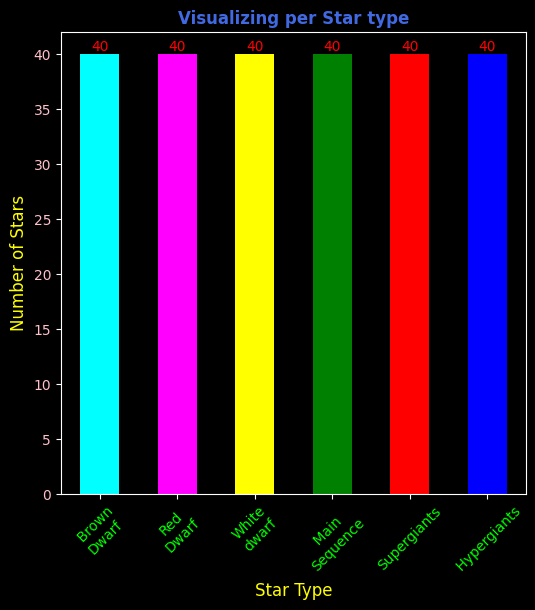

In [ ]:
plt.figure(figsize = (6,6))
plt.style.use('dark_background')
ax = stardf['Star type'].value_counts().plot(kind = 'bar', color = ['cyan','magenta','yellow','green','red','blue'])
ax.bar_label(ax.containers[0], color='red')
plt.title('Visualizing per Star type', color = 'royalblue', weight = 'bold')
plt.yticks(color = 'pink')
plt.ylabel('Number of Stars', color = 'yellow', fontsize = 12)
plt.xticks(ticks = [0,1,2,3,4,5], labels=[' Brown\nDwarf','Red\nDwarf','White\ndwarf', ' Main\nSequence','Supergiants',' Hypergiants'], rotation = 45, color ='lime')
plt.xlabel('Star Type', color = 'yellow', fontsize = 12)
plt.savefig(base_dir + 'bargraph_star_count.png')
plt.show()

**Now i'll visualize the star color data and here for a change i'll be using the seaborn to pull off the graph**

In [ ]:
stardf['Star color'].value_counts()

Star color
Red             116
Blue             56
Blue-White       41
Yellow-White     15
White            12
Name: count, dtype: int64

<ipython-input-8-ec0062121313>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = stardf['Star color'].value_counts().index,


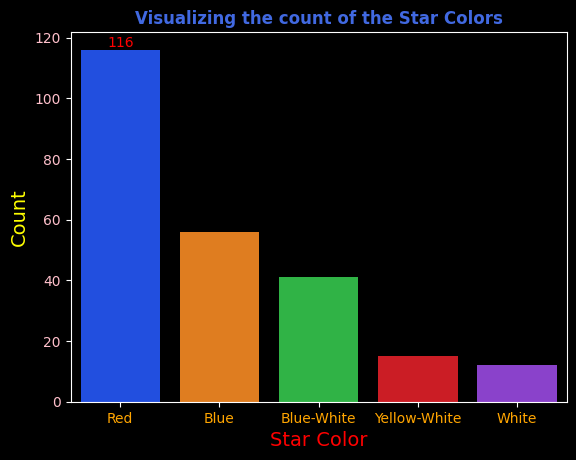

In [ ]:
ax = sns.barplot(x = stardf['Star color'].value_counts().index,
                 y = stardf['Star color'].value_counts(),
                 palette = 'bright' )
ax.bar_label(ax.containers[0], color = 'red')
plt.yticks(color = 'pink')
plt.ylabel('Count', color = 'yellow', fontsize = 14)
plt.xticks(color = 'orange')
plt.xlabel('Star Color', color = 'red', fontsize = 14)
plt.title('Visualizing the count of the Star Colors', color = 'royalblue', weight = 'bold')
plt.savefig(base_dir + "star_color_graph.png")
plt.show()


# **Now Visualizing the Outliers**

<Axes: xlabel='Star type', ylabel='Temperature (K)'>

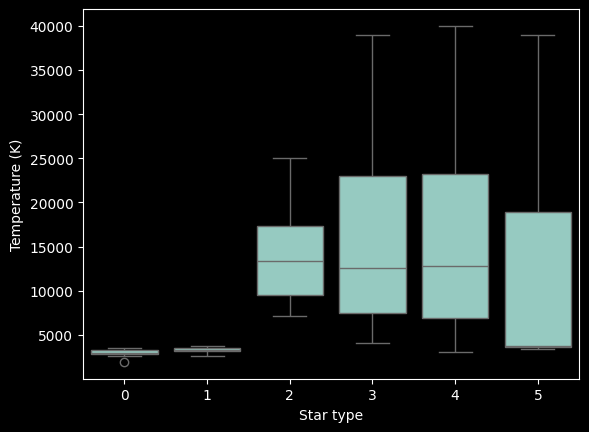

In [ ]:
# Visualizing the outliers in the data using box plot

sns.boxplot(x = stardf['Star type'], y = stardf.iloc[:,0])

<Axes: xlabel='Star type', ylabel='Luminosity(L/Lo)'>

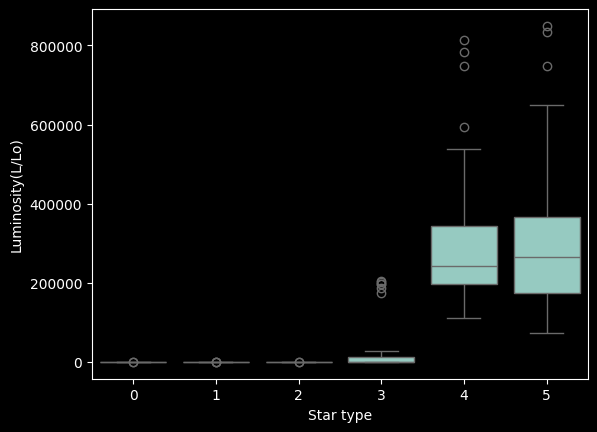

In [ ]:
# Visualizing the outliers in the data using box plot

sns.boxplot(x = stardf['Star type'], y = stardf.iloc[:,1])

# **If i want to see for the all first four columns(Numeric columns)**

In [ ]:
# plt.subplot(1,4,1)                  # four different graphs in one thats why (4)
# sns.boxplot(x = stardf['Star type'], y = stardf.iloc[:,0])
# plt.subplot(1,4,2)                  # four different graphs in one thats why (4)
# sns.boxplot(x = stardf['Star type'], y = stardf.iloc[:,1])
# # since its not good to manually change the index everytime, so i'll use for loop

In [ ]:
stardf.columns

Index(['Temperature (K)', 'Luminosity(L/Lo)', 'Radius(R/Ro)',
       'Absolute magnitude(Mv)', 'Star type', 'Star color', 'Spectral Class'],
      dtype='object')

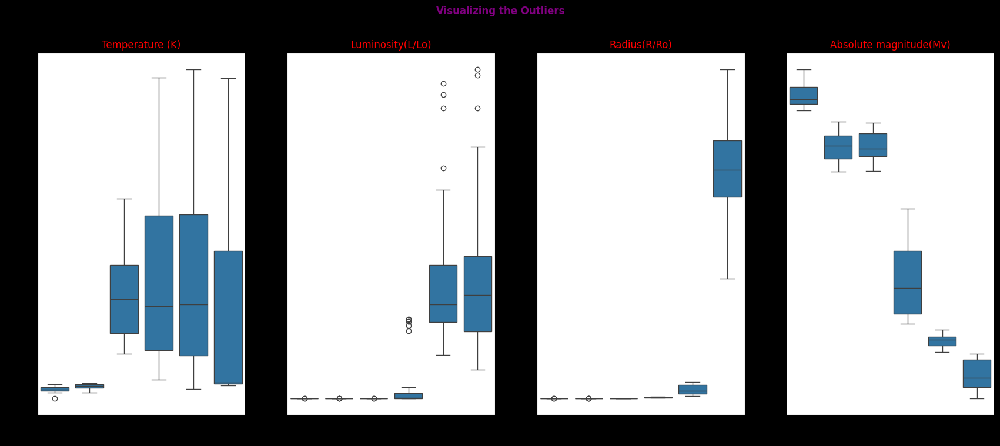

In [ ]:
plt.figure(figsize= (21,8))
plt.style.use('default')
plt.suptitle('Visualizing the Outliers', color = 'purple', weight = 'bold')
for i in range(4):
  plt.subplot(1, 4, i+1)
  sns.boxplot(x = stardf['Star type'], y = stardf.iloc[:,i])
  plt.title(stardf.columns[i], color = 'red')
  plt.ylabel('')

plt.savefig(base_dir + 'boxplot_outliers_star_type.png')

**Patterns in the numeric data**

In [ ]:
''' For suppose I want to the create the line plot for eachh and every numeric feature. In the outlier what i did was with respect to star type what is the
  distribution of the temperature, luminosity, radius and absolute magnitude, we got this kind of median values for each and every classes and the
  interquartile range and all of the kind of outliers that i anted to spot'''

  # help of line plot is to connect the temperature(Points) and try to observe that any kind of pattern is being formed or not.



' For suppose I want to the create the line plot for eachh and every numeric feature. In the outlier what i did was with respect to star type what is the\n  distribution of the temperature, luminosity, radius and absolute magnitude, we got this kind of median values for each and every classes and the\n  interquartile range and all of the kind of outliers that i anted to spot'

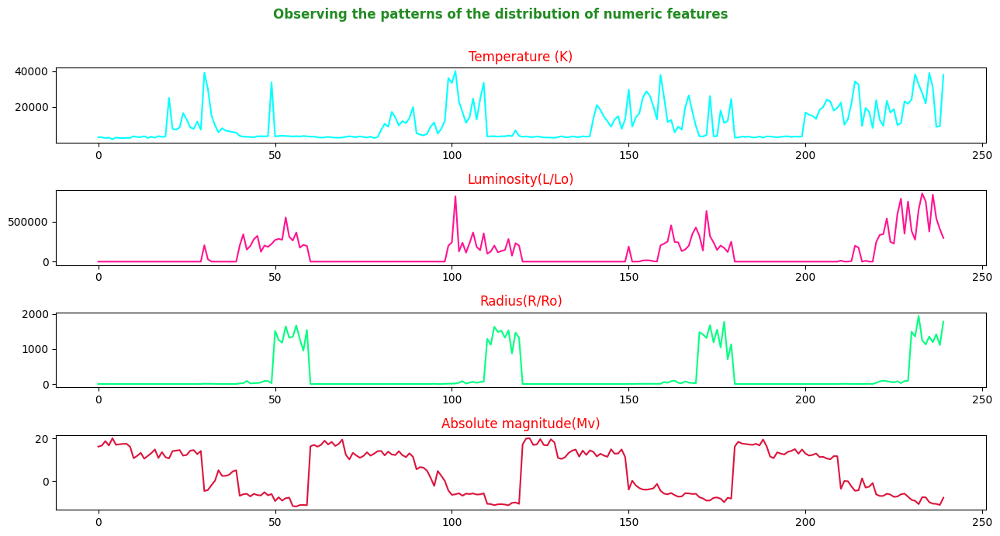

In [ ]:
# Line plot

colors = ['cyan', 'deeppink', 'springgreen', 'crimson']
plt.figure(figsize = (13,7))

plt.suptitle("Observing the patterns of the distribution of numeric features\n", color = 'forestgreen', weight = 'bold')
for i in range (4):
  plt.subplot(4,1,i+1)
  plt.plot(stardf.iloc[:,i], color = colors[i])
  plt.title(stardf.columns[i], color = 'red')


plt.tight_layout()
plt.savefig(base_dir +'distribution_of_num_features.png')
plt.show()









# **Now creating a Pair Plot**


The main purpose of creating a pair plot, for example i am going to take this temperature, so its going to take the temperature column and its going to compare with all the respective other columns(like luminosity,radius), like with respect to temperature how luminosity is varying.
by default pair plot is going to bein the format of scatter plot.
as there are lot kind of combinations we are creating(temp with all the other columns). pairplot of seaborn is that its going to get me rid of all kind of pain of subplots and functions etc.

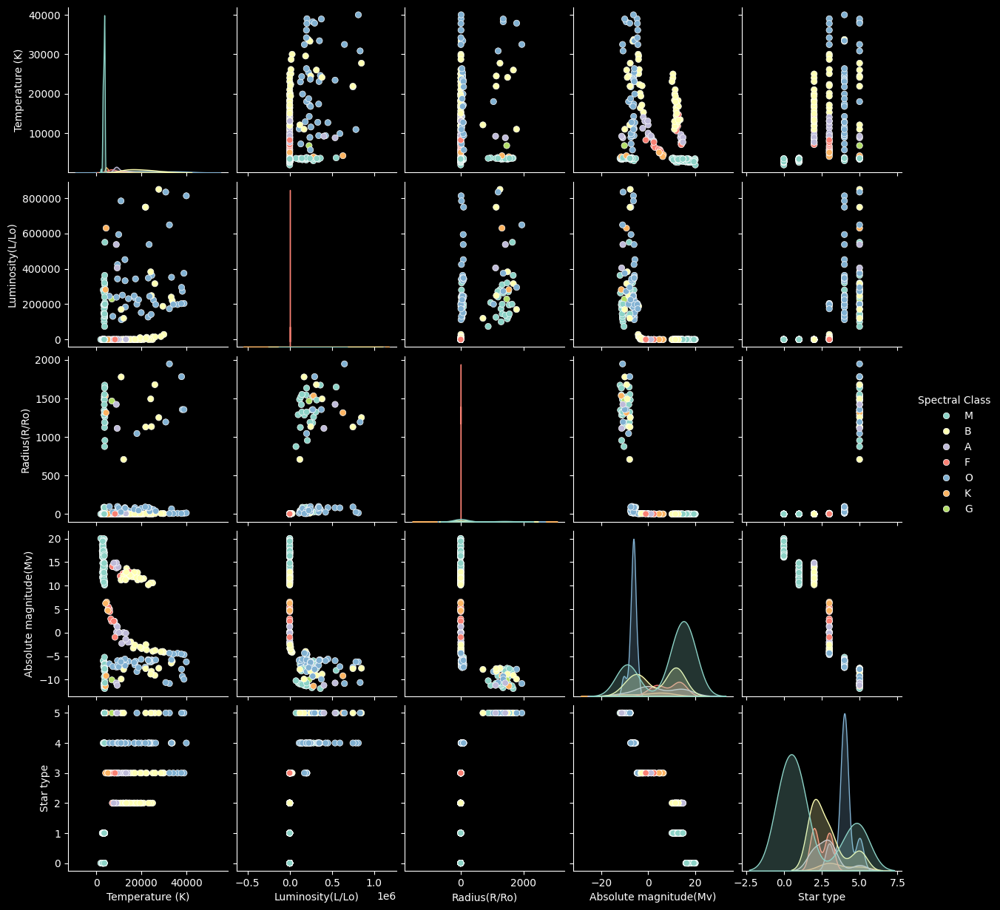

In [ ]:
# Pair plot

plt.style.use('dark_background')
sns.pairplot(stardf, hue = 'Spectral Class')
# plt.suptitle("Pair plot_comparing other parameters with respect to temperature", color = 'tab:orange')
plt.savefig(base_dir + 'pair_plot_temp.png')
plt.show()

# **Now the HR Diagram**

Its like how amazingly we can clasify this kind of different stars, dependng on its proporties ie., temperature, absolute magnitude and its spectral class and lumimosity. All the kind of previous visualiztions that has been created, they can be created if we have tabular data. Now, here I can create Hr Diagram because we have the data of star and its respective properties ie., temperature and absolute magnitude, because we have access to this two data only then i can create the HR diagram. We can't always be able to create this HR diagram.

Referring to this.

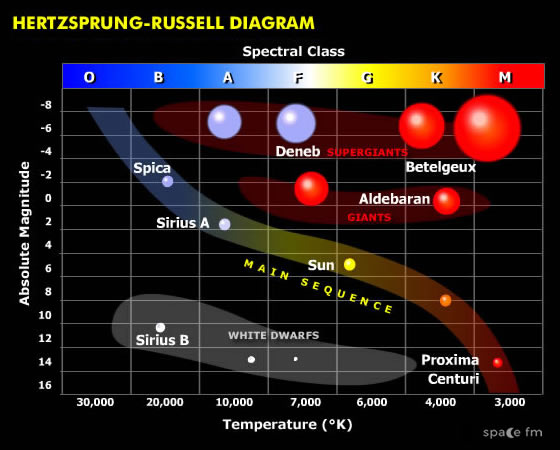

In [ ]:
# HR diagram
star_type = stardf['Star type'].values
temperature = stardf['Temperature (K)'].values                  #  fetching the values of temperature column
ab_mag = stardf['Absolute magnitude(Mv)'].values

star_types = {
    0: {'label': 'Brown Dwarf', 'color': 'brown', 'size': 30, 'marker': '.'},
    1: {'label': 'Red Dwarf', 'color': 'red', 'size': 35, 'marker': '.'},
    2: {'label': 'White Dwarf', 'color': 'white', 'size': 40, 'marker': '.'},
    3: {'label': 'Main Sequence', 'color': 'cyan', 'size': 30, 'marker': 'o'},
    4: {'label': 'Supergiants', 'color': 'orange', 'size': 100, 'marker': 'o'},
    5: {'label': 'Hypergiants', 'color': 'maroon', 'size': 150, 'marker': 'o'}
}
# print(len(star_type))
# creating a scatter plot for this

# plt.scatter(temperature, ab_mag)
# plt.show()

# As I can see plot is not correct,
# because if I refer to the above diagram, the supergiants and the hypergiants stars are existing on somewhere on the top parts, but I can't see anything
# like this in the scatter plot here. The reason here is if I see the axes of above diagram the temperature and absolute magnitude, the values are starting
# from higher value and going all the way to the lower values, same goes with the absolute magnitude axis.

# So here i need to invert both the axis.
'''
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.show()

'''
# So this is what i expected, on the bottom we are having red dwwarf, brown dwarf and on the top we are having super giants and hypergiants.
# Now, here  haven't added any kind of colours and sizes, to add this kind of funcationaloities in this graphs, for each and every stars
# there are some unique properties of both x and y and along with that it ha some color depending on which type of star it is and also label given
# to that particular star.
# So here I need python dictionary to carry out the mentioned operations.



'\nplt.gca().invert_xaxis()\nplt.gca().invert_yaxis()\nplt.show()\n\n'

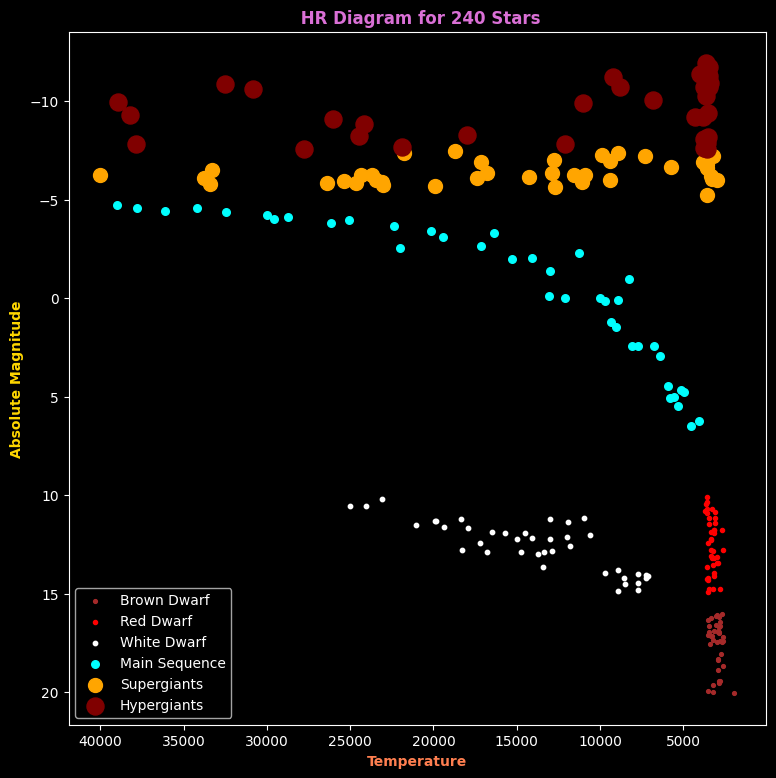

In [ ]:
axes = []
# empty list
labels = set()
# empty set

plt.figure(figsize = (9,9))



for i in range(len(star_type)):
  properties = star_types[star_type[i]]

  if properties['label'] not in labels:
    ax = plt.scatter(temperature[i], ab_mag[i],
                    s = properties['size'],
                    c = properties['color'],
                    label =  properties['label'],
                    marker = properties['marker'])
    axes.append(ax)
    labels.add(properties['label'])
  else:
    ax = plt.scatter(temperature[i], ab_mag[i],
                    s = properties['size'],
                    c = properties['color'],
                    label =  properties['label'],
                    marker = properties['marker'])


plt.title(f" HR Diagram for {len(star_type)} Stars", color = 'orchid', weight = 'bold')
plt.xlabel('Temperature', color = 'coral', weight = 'bold')
plt.ylabel('Absolute Magnitude', color = 'gold', weight = 'bold')

plt.legend(handles =  axes)

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.savefig(base_dir + 'HR diagram.png')
plt.show()


# **Now Visualizing the Spectral Class**

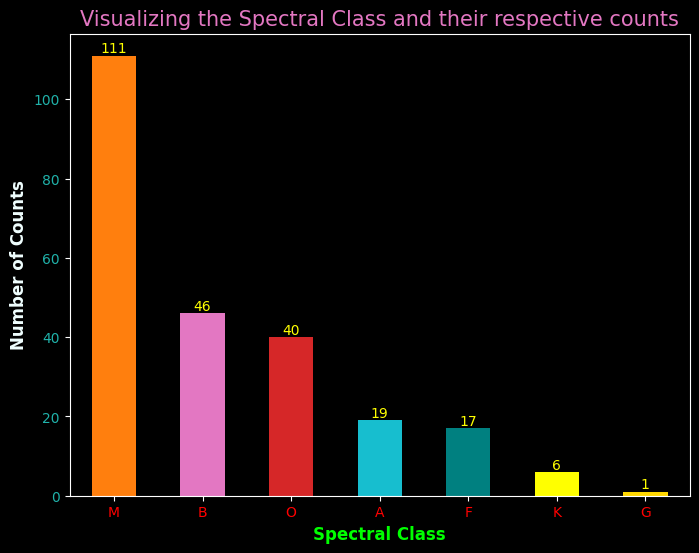

In [ ]:
plt.figure(figsize=(8,6))
plt.title("Visualizing the Spectral Class and their respective counts", color = 'tab:pink', fontsize = 15)
ax = stardf['Spectral Class'].value_counts().plot(kind = 'bar',
                                             color = ['tab:orange', 'tab:pink', 'tab:red', 'tab:cyan', 'teal', 'yellow','gold'])
ax.bar_label(ax.containers[0], color = 'yellow')
plt.xlabel('Spectral Class', color = 'lime', weight = 'bold', fontsize = 12)
plt.xticks(color = 'red', rotation = 360)
plt.ylabel('Number of Counts', color = 'azure', weight = 'bold', fontsize = 12)
plt.yticks(color = 'lightseagreen')
plt.savefig(base_dir + 'spectral class visualization.png')
plt.show()


# **HR Diagram (Absolute magnitude vs Spectral type)**

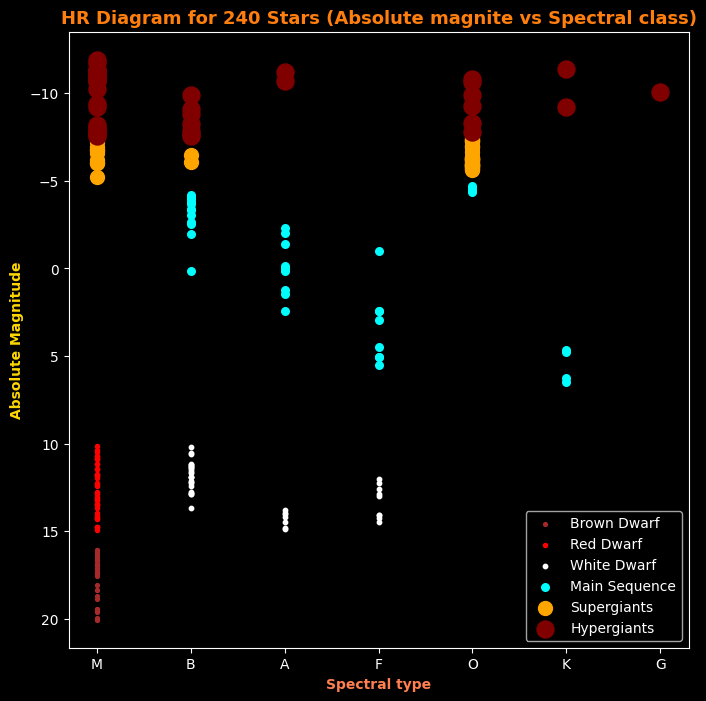

In [ ]:

star_type = stardf['Star type'].values
ab_mag = stardf['Absolute magnitude(Mv)'].values
spec_class = stardf['Spectral Class'].values

star_types = {
    0: {'label': 'Brown Dwarf', 'color': 'brown', 'size': 30, 'marker': '.'},
    1: {'label': 'Red Dwarf', 'color': 'red', 'size': 35, 'marker': '.'},
    2: {'label': 'White Dwarf', 'color': 'white', 'size': 40, 'marker': '.'},
    3: {'label': 'Main Sequence', 'color': 'cyan', 'size': 30, 'marker': 'o'},
    4: {'label': 'Supergiants', 'color': 'orange', 'size': 100, 'marker': 'o'},
    5: {'label': 'Hypergiants', 'color': 'maroon', 'size': 150, 'marker': 'o'}
}


axes = []
labels = set()

plt.figure(figsize = (8,8))
plt.style.use('dark_background')

for i in range(len(star_type)):
  properties = star_types[star_type[i]]

  if properties['label'] not in labels:
    ax = plt.scatter(spec_class[i], ab_mag[i],
                    s = properties['size'],
                    c = properties['color'],
                    label = properties['label'] ,
                    marker = properties['marker'])
    axes.append(ax)
    labels.add(properties['label'])
  else:
    ax = plt.scatter(spec_class[i], ab_mag[i],
                    s = properties['size'],
                    c = properties['color'],
                    label = properties['label'] ,
                    marker = properties['marker'])

plt.title(f'HR Diagram for {len(star_type)} Stars (Absolute magnite vs Spectral class)', color = 'tab:orange', weight= 'bold', fontsize = 13)
plt.legend(handles = axes)
plt.xlabel('Spectral type', color = 'coral', weight = 'bold')
plt.ylabel('Absolute Magnitude', color = 'gold', weight = 'bold')

plt.gca().invert_yaxis()
plt.savefig(base_dir + 'HR Diagram_spectral_class_vs_abs_magnitude.png')
plt.show()


**So this was the HR diagram**

---



# **Now Extracting the visualized data to the system**

In [ ]:
from google.colab import files                            # import files from colab module of google
!zip -r /content/steller_plot.zip /content/steller_plot       # create a zip file of the folder in the same location where we created the base directory
files.download('/content/steller_plot.zip')                     # download the zip file

  adding: content/steller_plot/ (stored 0%)
  adding: content/steller_plot/spectral class visualization.png (deflated 13%)
  adding: content/steller_plot/bargraph_star_count.png (deflated 11%)
  adding: content/steller_plot/pair_plot_temp.png (deflated 3%)
  adding: content/steller_plot/star_color_graph.png (deflated 12%)
  adding: content/steller_plot/HR Diagram_spectral_class_vs_abs_magnitude.png (deflated 8%)
  adding: content/steller_plot/distribution_of_num_features.png (deflated 5%)
  adding: content/steller_plot/boxplot_outliers_star_type.png (deflated 29%)
  adding: content/steller_plot/HR diagram.png (deflated 10%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>